In [1]:
# import modules
import numpy as np
import pandas as pd
import sklearn
from matplotlib import pyplot as plt
from PIL import Image

plt.rcParams["figure.figsize"] = (20,10)

In [2]:
def letter_converter(letter):
    try:
        result = 0
        letters = {"F": 0, "E": 1, "D": 2, "C": 3, "B": 4, "A": 5, "+": 0.3, "-": -0.3}
        for s in letter:
            result += letters[s]
        return result
    except:
        # print("Error parsing " + letter)
        return 0
        
def price_converter(price):
    try:
        price = price.replace(",", "")
        return int(price)
    except:
        # print("Error parsing " + price)
        return 0

In [3]:
df = pd.read_csv("../data/AB_NYC_2019_updated.csv", converters={
    "amenities": letter_converter,
    "cost_of_living": letter_converter,
    "crime": letter_converter,
    "employment": letter_converter,
    "housing": letter_converter,
    "school": letter_converter,
    "weather": letter_converter,
    "home_median": price_converter,
    "rent_median": price_converter
})

room_df = pd.get_dummies(df['room_type'])
df = pd.concat([df, room_df], axis=1).drop("room_type", axis=1)
print(df.iloc[:10])

   Unnamed: 0      id                                   name  host_id  \
0           0    2539     Clean & quiet apt home by the park     2787   
1           1    2539     Clean & quiet apt home by the park     2787   
2           2   63546         Large and Cozy Private Bedroom   308652   
3           3   63546         Large and Cozy Private Bedroom   308652   
4           4  125594     SUPER BIG AND COZY PRIVATE BEDROOM   308652   
5           5  125594     SUPER BIG AND COZY PRIVATE BEDROOM   308652   
6           6  267652  Private clean pleasant spacious room.   164675   
7           7  267652  Private clean pleasant spacious room.   164675   
8           8  282341    Kensington/Ditmas Park pied-a-terre  1471384   
9           9  282341    Kensington/Ditmas Park pied-a-terre  1471384   

  host_name neighbourhood_group neighbourhood  latitude  longitude  price  \
0      John            Brooklyn    Kensington  40.64749  -73.97237    149   
1      John            Brooklyn    Kensing

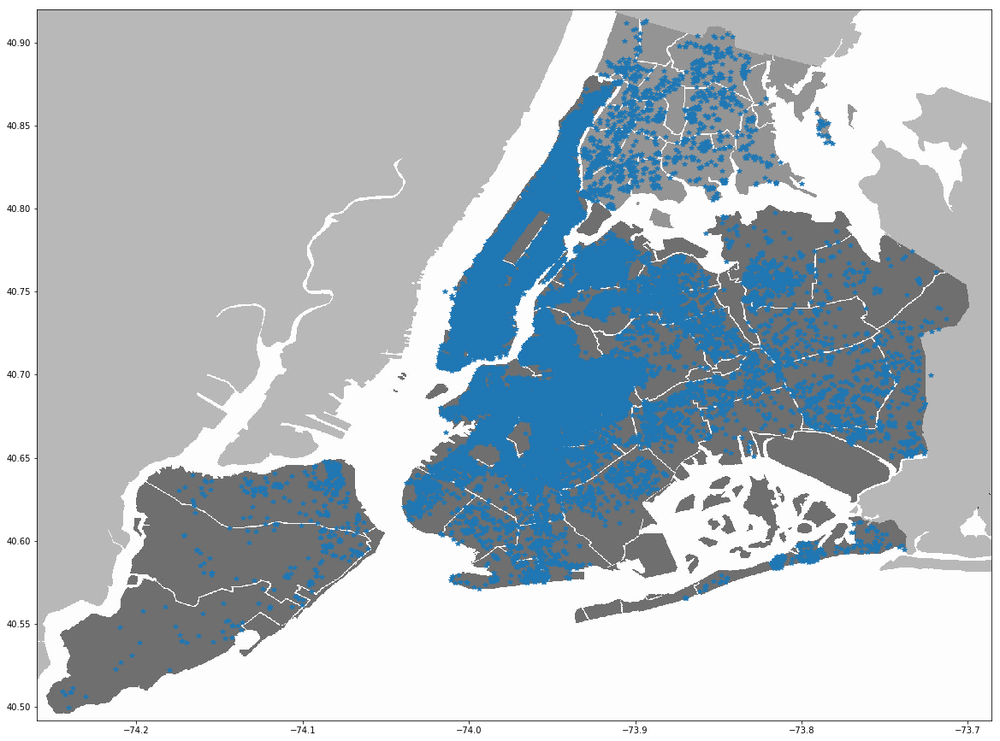

In [4]:
latitude_range = (40.492, 40.92)
longitude_range = (-74.26, -73.686)

plt.rcParams["figure.figsize"] = (20,20)

ny_map = np.array(Image.open('../data/New_York_City_.png'))
plt.imshow(ny_map, extent=longitude_range+latitude_range)
positions = np.array(df[['longitude', 'latitude']])
plt.plot(positions[:, 0], positions[:, 1], '*')

In [8]:
# GMM without position
from sklearn.mixture import GaussianMixture

X = df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']]
X = np.array(X)
X[np.isnan(X)] = 0

best_k = 1
best_bic = None
for k in range(1, 20):
    gmm = GaussianMixture(k)
    y = gmm.fit_predict(X)
    bic = gmm.bic(X)
    print("k=%d, bic=%f" % (k, bic))
    if best_bic is None or bic < best_bic:
        best_bic, best_k = bic, k

k = best_k
gmm = GaussianMixture(best_k)
y = gmm.fit_predict(X)
print("Weights: ", gmm.weights_)
print("Means: ", gmm.means_)

k=1, bic=2997373.622767
k=2, bic=2627298.585564
k=3, bic=2419933.458809
k=4, bic=1766720.473710
k=5, bic=1724878.881612
k=6, bic=1683870.905055
k=7, bic=1807019.754730
k=8, bic=1596801.444493
k=9, bic=1496203.455221
k=10, bic=1613873.989418
k=11, bic=1575044.870022
k=12, bic=1383260.561249
k=13, bic=1528086.745042
k=14, bic=1374035.232860
k=15, bic=1517011.439919
k=16, bic=1354625.063299
k=17, bic=1515164.109232
k=18, bic=1343061.670633
k=19, bic=1258032.909287
Weights:  [3.55867840e-02 7.86323331e-02 4.26501502e-02 4.76653044e-03
 2.53542141e-01 1.59006498e-02 2.58686951e-01 1.37179588e-04
 1.13343775e-02 3.79183444e-02 1.22303570e-02 1.47728447e-02
 3.22775412e-02 1.38758607e-02 9.21693466e-02 1.49869144e-02
 6.70220271e-03 7.42858919e-03 6.64009021e-02]
Means:  [[8.92867105e+01 2.97264178e+00 3.86674812e+01 2.12029177e+00
  2.19532441e+00 1.46982080e+02]
 [1.38880286e+02 1.02619093e+01 0.00000000e+00 0.00000000e+00
  1.39444302e+00 1.26486405e+02]
 [1.51477074e+02 3.00000000e+01 4.5

In [8]:
def plot_map(y, k):
    plt.rcParams["figure.figsize"] = (70,70)
    plt.imshow(ny_map, extent=longitude_range+latitude_range)
    positions = np.array(df[['longitude', 'latitude']])
    colors = ((1, 0.5, 0), (0.5, 1, 0), (1, 0, 0.5), (0.5, 0, 1), (0, 1, 0.5), (0, 0.5, 1), (1, 0, 0), (0, 0, 1), '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf')
    for i in range(k):
        plt.plot(positions[:, 0][y==i], positions[:, 1][y==i], 'o', color=colors[i])
    plt.legend(("Class %d" % i for i in range(k)))

IndexError: tuple index out of range

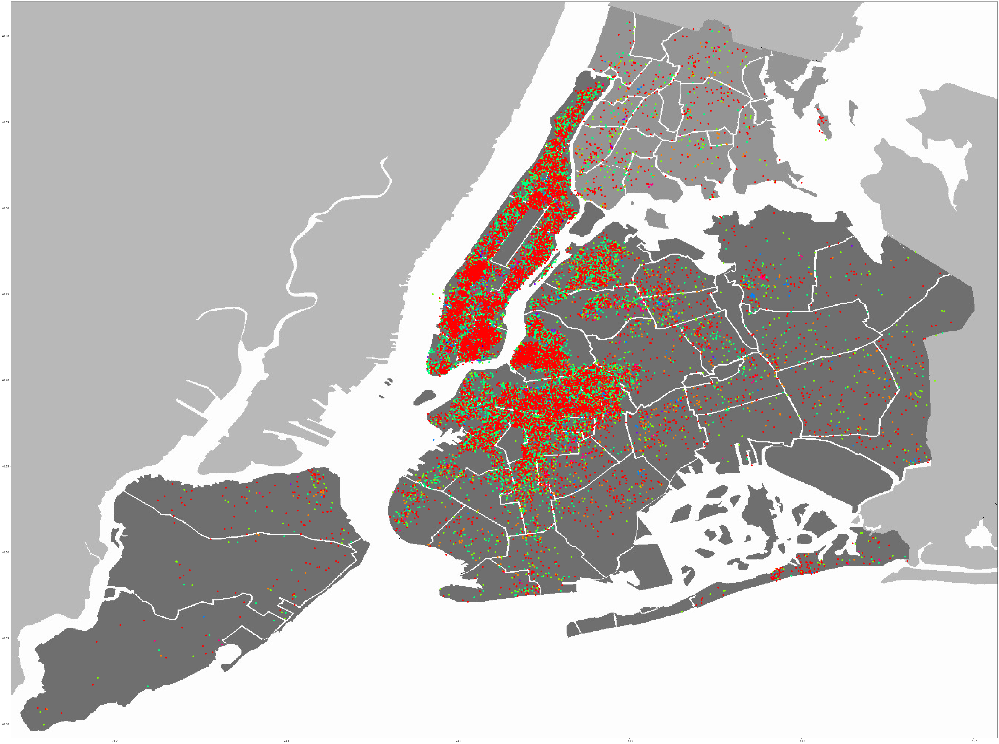

In [9]:
plot_map(y, k)

k=1, bic=2294562.510368
k=2, bic=1856717.584594
k=3, bic=1394380.883710
k=4, bic=1347383.436169
k=5, bic=1329387.036411
k=6, bic=1010265.047016
k=7, bic=1083283.814227
k=8, bic=988132.213254
k=9, bic=977794.510513
k=10, bic=930188.351978
k=11, bic=970562.180595
k=12, bic=779101.207065
k=13, bic=934427.487159
k=14, bic=678531.327026
k=15, bic=718776.265405
k=16, bic=868262.914568
k=17, bic=829483.713863
k=18, bic=668500.587755
k=19, bic=626313.043546


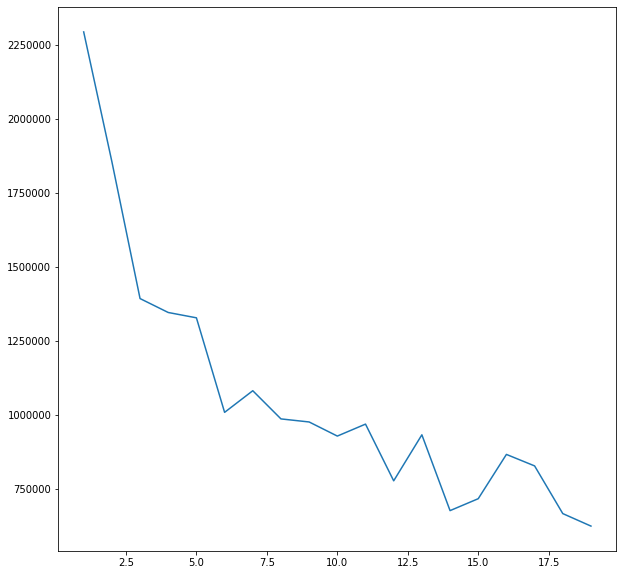

In [34]:
# GMM without position and price
from sklearn.mixture import GaussianMixture

X = df[['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']]
X = np.array(X)
X[np.isnan(X)] = 0

best_k = 1
best_bic = None
bic_list = []
for k in range(1, 20):
    gmm = GaussianMixture(k)
    y = gmm.fit_predict(X)
    bic = gmm.bic(X)
    bic_list.append(bic)
    print("k=%d, bic=%f" % (k, bic))
    if best_bic is None or bic < best_bic:
        best_bic, best_k = bic, k
        
plt.rcParams["figure.figsize"] = (10, 10)
plt.plot(range(1, 20), bic_list)

In [ ]:
k = 15
gmm = GaussianMixture(15)
y = gmm.fit_predict(X)
print("Weights: ", gmm.weights_)
print("Means: ", gmm.means_)

In [ ]:
plot_map(y, k)

k=1, bic=703448.168868
k=2, bic=613390.729253
k=3, bic=600289.906729
k=4, bic=594134.080742
k=5, bic=592181.051575
k=6, bic=591992.068311
k=7, bic=591629.508341
k=8, bic=592290.302623
k=9, bic=591069.919938
k=10, bic=591220.797592
k=11, bic=590942.892384
k=12, bic=589704.219536
k=13, bic=589887.013397
k=14, bic=589849.432037
k=15, bic=589159.359252
k=16, bic=589606.207189
k=17, bic=589520.070432
k=18, bic=589096.338833
k=19, bic=589704.133735


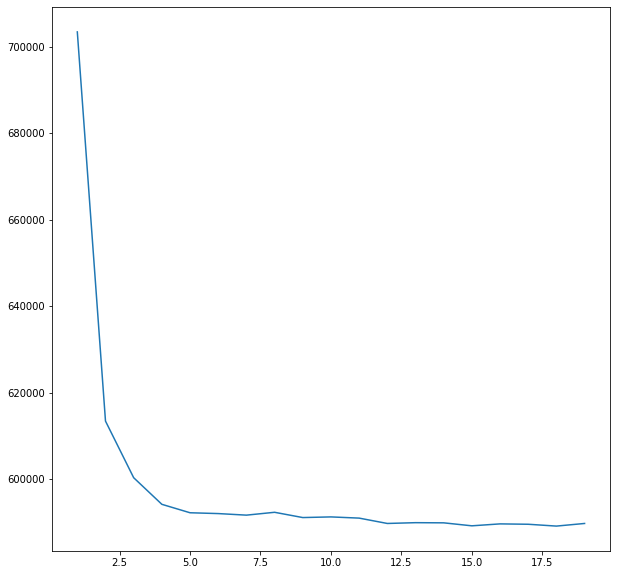

In [21]:
# GMM without position
from sklearn.mixture import GaussianMixture

X = df[['price']]
X = np.array(X)
X[np.isnan(X)] = 0

best_k = 1
best_bic = None
bic_list = []
for k in range(1, 20):
    gmm = GaussianMixture(k)
    y = gmm.fit_predict(X)
    bic = gmm.bic(X)
    bic_list.append(bic)
    print("k=%d, bic=%f" % (k, bic))
    if best_bic is None or bic < best_bic:
        best_bic, best_k = bic, k
        
plt.rcParams["figure.figsize"] = (10, 10)
plt.plot(range(1, 20), bic_list)

In [22]:
k = 4
gmm = GaussianMixture(k)
y = gmm.fit_predict(X)
print("Weights: ", gmm.weights_)
print("Means: ", gmm.means_)

Weights:  [0.56064943 0.36398162 0.00595398 0.06941496]
Means:  [[  79.94317172]
 [ 184.2972771 ]
 [2128.38110076]
 [ 431.32407481]]


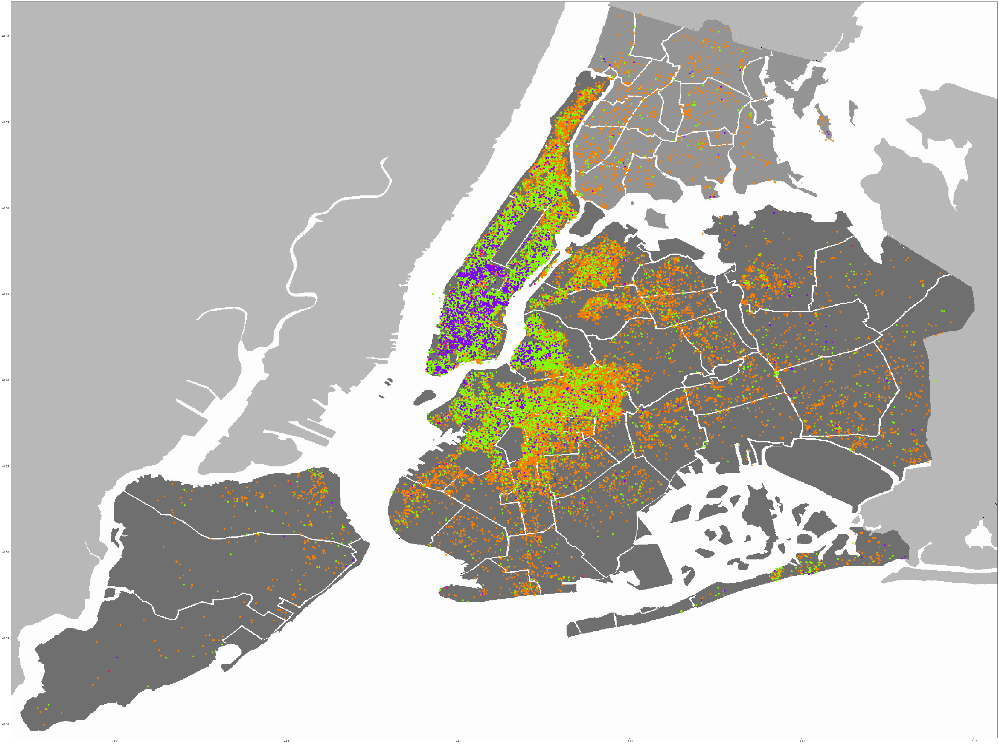

In [23]:
plot_map(y, k)

In [30]:
from sklearn.decomposition import PCA

X = df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']]
X = np.array(X)
X[np.isnan(X)] = 0

X = (X - np.mean(X, axis=0)) / np.std(X, axis=0)
pca = PCA(n_components=2)
pca.fit(X)  

print(pca.components_)
print(pca.explained_variance_ratio_)

[[-0.08365907 -0.17285388  0.66811578  0.67152492 -0.08160605  0.24318456]
 [ 0.27471265  0.47328343  0.01009239 -0.00294643  0.57798439  0.60527619]]
[0.28136559 0.22985618]


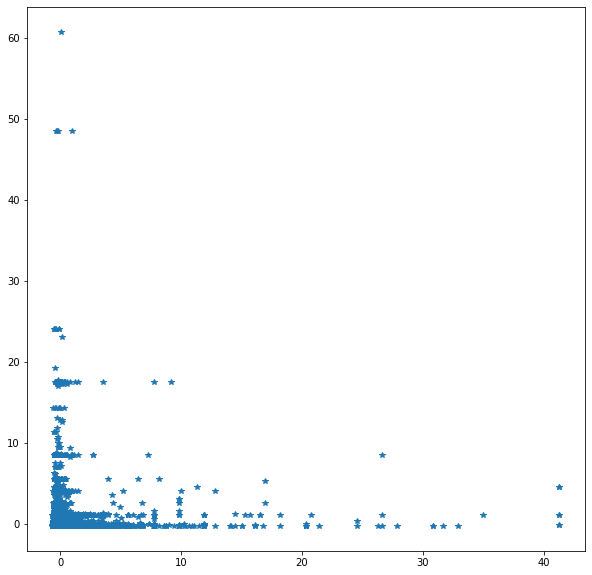

In [33]:
X_reduced = pca.transform(X)
plt.rcParams["figure.figsize"] = (10, 10)
plt.plot(X[:, 0], X[:, 1], '*')

In [7]:
# GMM without position
from sklearn.mixture import GaussianMixture

X = df[['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']]
X = np.array(X)
X[np.isnan(X)] = 0

best_k = 1
best_bic = None
for k in range(1, 20):
    gmm = GaussianMixture(k)
    y = gmm.fit_predict(X)
    bic = gmm.bic(X)
    print("k=%d, bic=%f" % (k, bic))
    if best_bic is None or bic < best_bic:
        best_bic, best_k = bic, k

k = best_k
gmm = GaussianMixture(best_k)
y = gmm.fit_predict(X)
print("Weights: ", gmm.weights_)
print("Means: ", gmm.means_)

k=1, bic=2671054.148942
k=2, bic=2295927.511738
k=3, bic=2089535.801885
k=4, bic=1649437.546131
k=5, bic=1477111.516784
k=6, bic=1352440.052467
k=7, bic=1307100.888801
k=8, bic=1150666.768174
k=9, bic=1146037.269813
k=10, bic=1101256.327738


C:\Anaconda3\lib\site-packages\sklearn\mixture\base.py:265: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


k=11, bic=1083082.272469
k=12, bic=1215875.068813
k=13, bic=1050196.438027
k=14, bic=1188218.255753
k=15, bic=978530.791319
k=16, bic=1066485.508361
k=17, bic=1137918.312451
k=18, bic=1167499.028380
k=19, bic=983086.372531
Weights:  [7.27275751e-03 2.97374065e-01 1.99604169e-02 5.42808616e-03
 8.64565720e-03 1.53580776e-02 5.75998319e-02 2.59418245e-01
 2.40150015e-02 4.12571397e-02 3.98881531e-02 4.61778989e-02
 8.10298866e-02 1.17582504e-04 9.64572002e-02]
Means:  [[ 4.07240291e+01 -7.40001483e+01  2.46179479e+02  1.51770875e+01
   3.57580452e+00  1.10251092e+00  3.08917236e+02  3.01254449e+02]
 [ 4.07296404e+01 -7.39537144e+01  1.49811047e+02  2.70901784e+00
   3.77256684e+01  1.85620801e+00  1.00000000e+00  1.25823925e+02]
 [ 4.07157175e+01 -7.39424492e+01  1.45273988e+02  1.34147913e+01
   5.59724622e+01  2.54406620e+00  5.74349532e+00  1.87012782e+02]
 [ 4.07418426e+01 -7.39719367e+01  1.60756260e+03  4.43835802e+01
   1.30917299e+01  4.73246260e-01  6.91373065e+00  2.02136438e+0

In [25]:
k = 5
gmm = GaussianMixture(5)
y = gmm.fit_predict(X)
print("Weights: ", gmm.weights_)
print("Means: ", gmm.means_)

Weights:  [0.28144573 0.06855739 0.42655897 0.13789474 0.08554316]
Means:  [[ 4.07311618e+01 -7.39605330e+01  1.29452856e+02  3.43392298e+00
   4.72759021e+00  1.96839654e-01  1.00000000e+00  0.00000000e+00]
 [ 4.07306126e+01 -7.39600932e+01  3.95716656e+02  3.08498564e+01
   6.75726583e+00  3.31888681e-01  4.35210011e+00  1.90017925e+02]
 [ 4.07273120e+01 -7.39442355e+01  1.26890608e+02  2.35446001e+00
   4.65004442e+01  2.20644453e+00  1.87355920e+00  1.45510384e+02]
 [ 4.07296816e+01 -7.39553661e+01  1.41060380e+02  8.40554938e+00
   1.50262129e+00  6.45970368e-02  1.52352339e+00  1.21059104e+02]
 [ 4.07387157e+01 -7.39712880e+01  2.03084991e+02  2.14068602e+01
   1.76275818e+01  8.78631202e-01  6.72915826e+01  2.55932777e+02]]


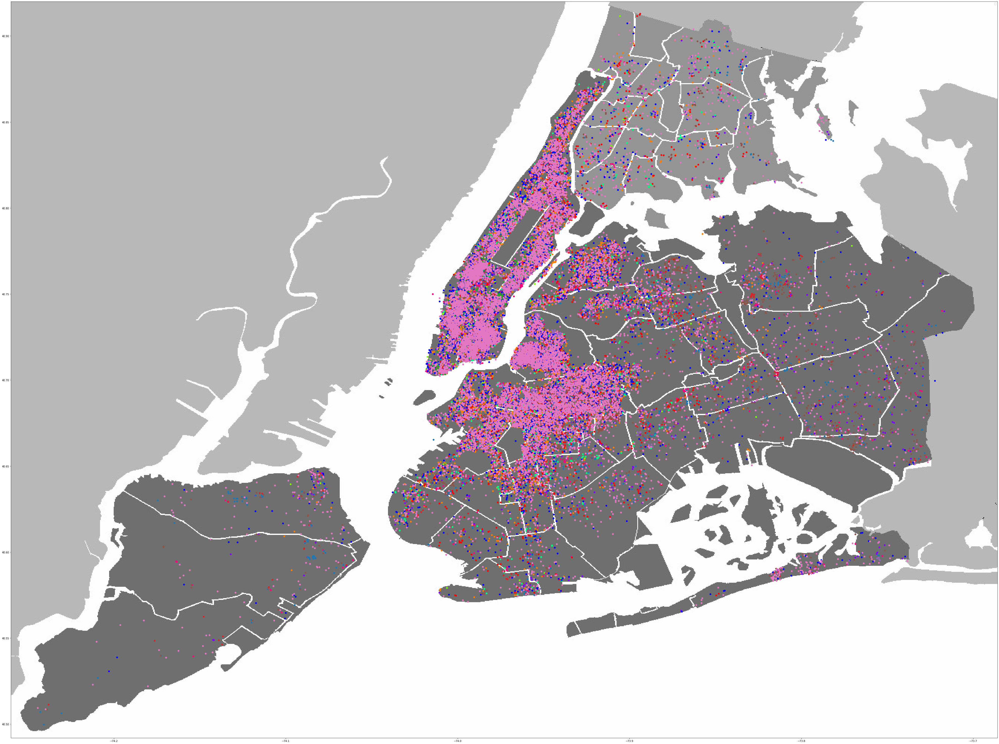

In [17]:
plot_map(y, k)

[2 2 2 ... 3 3 2]
[0. 0. 0. ... 0. 0. 0.]


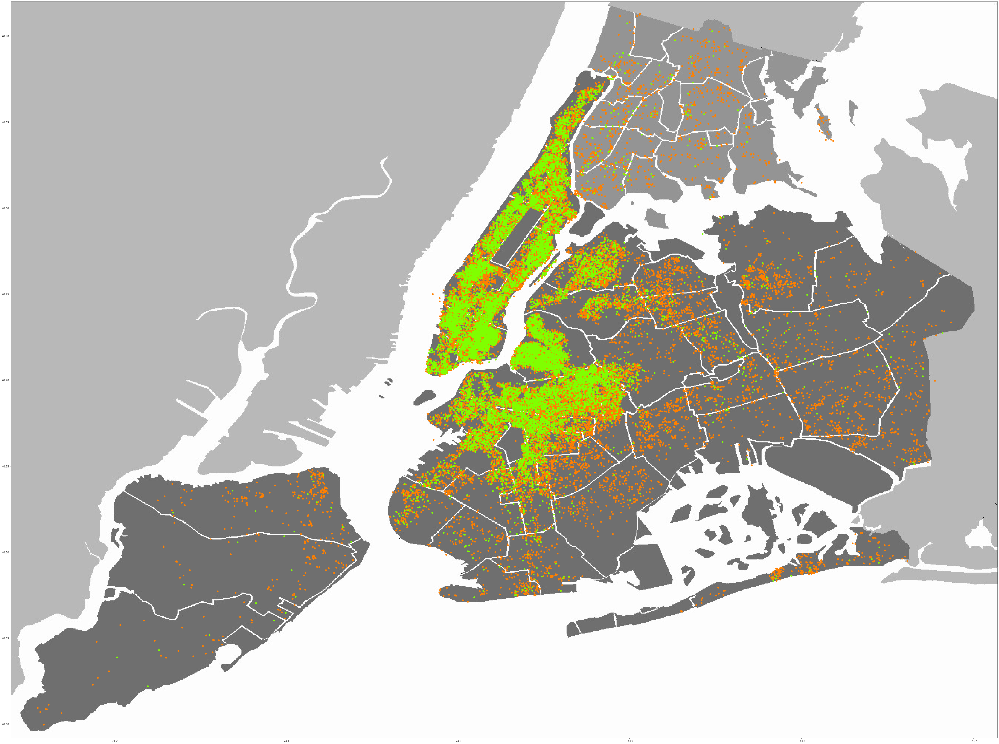

[0. 0. 0. ... 0. 0. 0.]


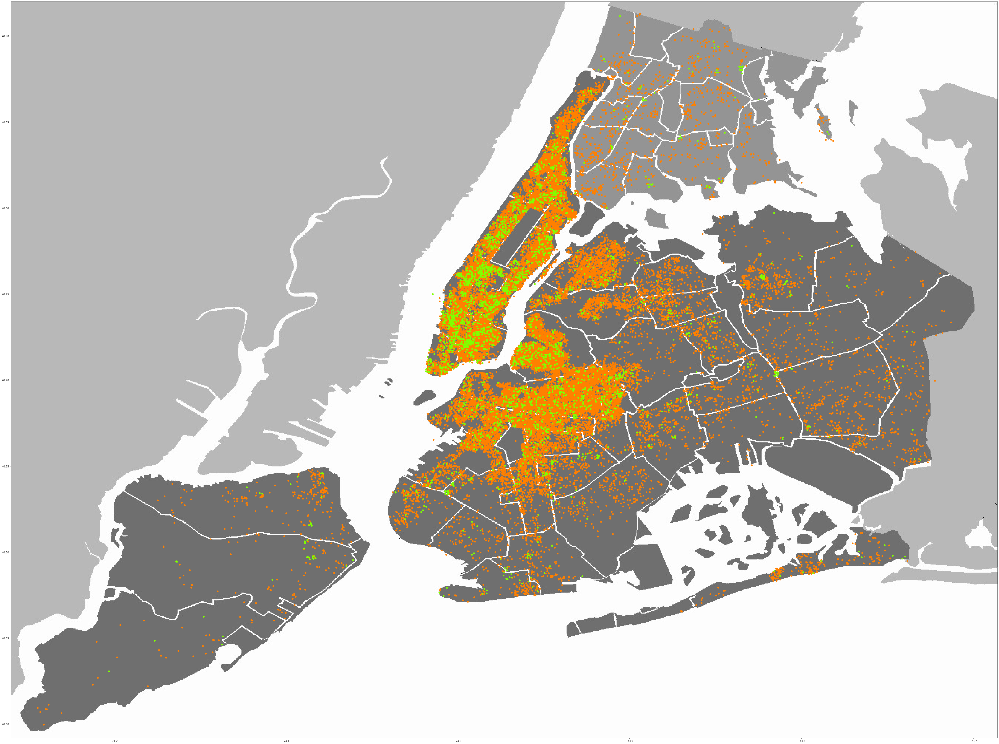

[1. 1. 1. ... 0. 0. 1.]


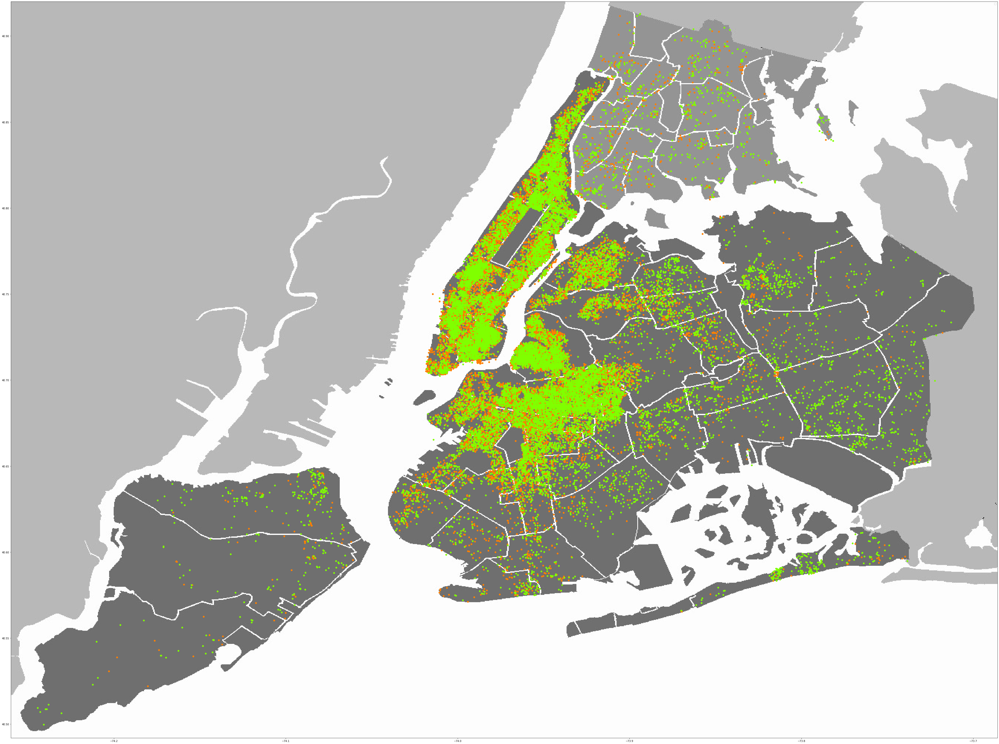

[0. 0. 0. ... 1. 1. 0.]


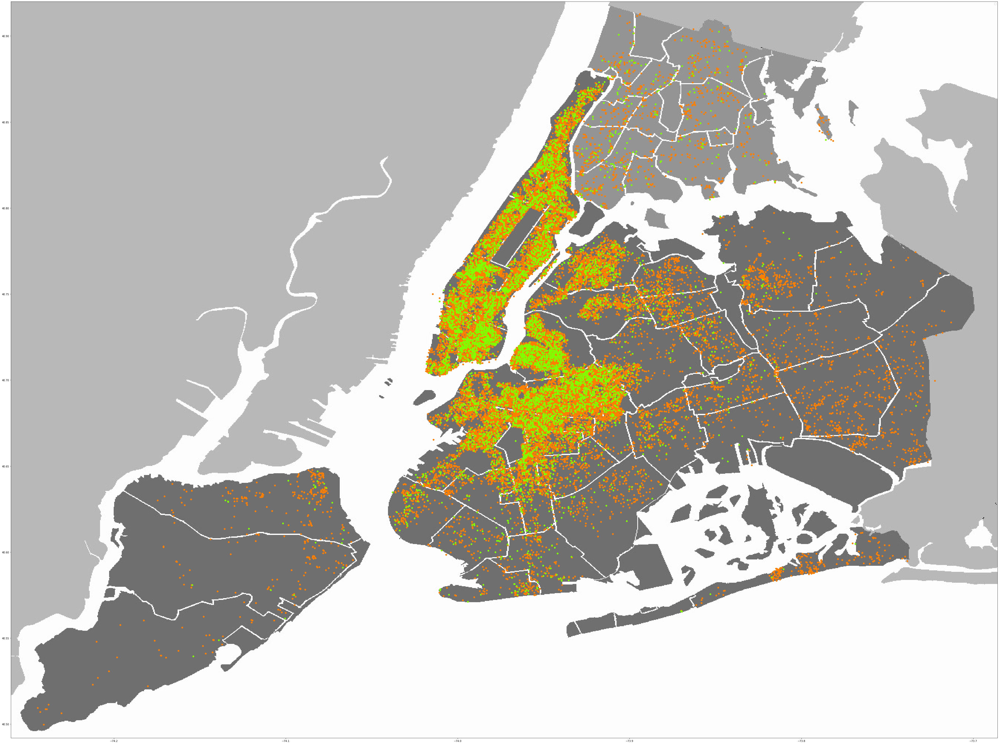

[0. 0. 0. ... 0. 0. 0.]


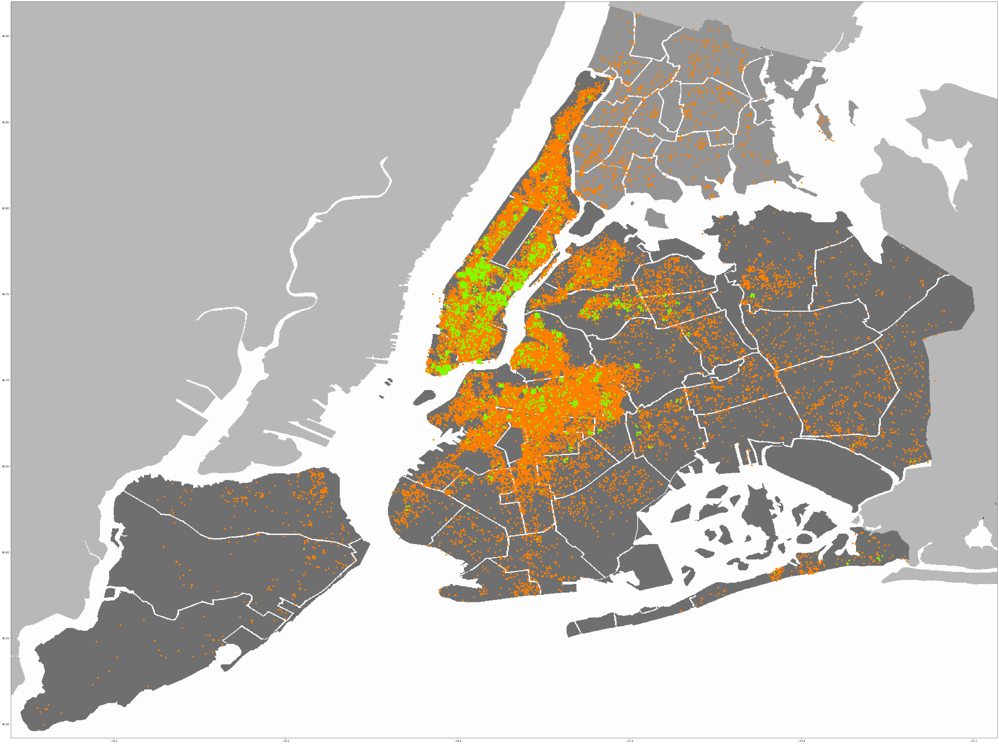

In [26]:
print(y)
for i in range(k):
    Y = np.zeros(len(y))
    Y[y == i] = 1
    Y[y != i] = 0
    print(Y)
    plot_map(Y, 2)
    plt.show()